In [0]:
!pip install pyspark

     |▍    

*** WARNING: max output size exceeded, skipping output. ***

     |████████████████████████████████| 317.0 MB 10 kB/s 
     |████████████████████████████████| 200 kB 42.3 MB/s 
  Created wheel for pyspark: filename=pyspark-3.5.1-py2.py3-none-any.whl size=317488511 sha256=b9f4590c4679425c5d1c18034daff695d42c14628d356aac2b793c7e0fdb925d
  Stored in directory: /root/.cache/pip/wheels/92/09/11/aa01d01a7f005fda8a66ad71d2be7f8aa341bddafb27eee3c7
Successfully built pyspark
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-59aaf0cf-4131-486f-9dc1-593af87ed76d/bin/python -m pip install --upgrade pip' command.


In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, year, to_timestamp, when
import requests

In [0]:
spark = SparkSession.builder \
    .appName("Flight Delays Analysis") \
    .config("spark.sql.legacy.timeParserPolicy", "CORRECTED") \
    .getOrCreate()

In [0]:
spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")

In [0]:
from pyspark.sql import SparkSession

# Initialize Spark session with LEGACY time parser policy
spark = SparkSession.builder \
    .appName("Flight Delay Prediction Models") \
    .config("spark.sql.legacy.timeParserPolicy", "LEGACY") \
    .getOrCreate()

In [0]:
file_path = 'dbfs:/FileStore/shared_uploads/apurvapadwal23@gmail.com/Flights_603.csv'

# Read the CSV file into a Spark DataFrame
df = spark.read.csv(file_path, header=True, inferSchema=True)



In [0]:
display(df)

FlightDate,Airline,Origin,Dest,Cancelled,Diverted,CRSDepTime,DepTime,DepDelayMinutes,DepDelay,ArrTime,ArrDelayMinutes,AirTime,CRSElapsedTime,ActualElapsedTime,Distance,Year,Quarter,Month,DayofMonth,DayOfWeek,Marketing_Airline_Network,Operated_or_Branded_Code_Share_Partners,DOT_ID_Marketing_Airline,IATA_Code_Marketing_Airline,Flight_Number_Marketing_Airline,Operating_Airline,DOT_ID_Operating_Airline,IATA_Code_Operating_Airline,Tail_Number,Flight_Number_Operating_Airline,OriginAirportID,OriginAirportSeqID,OriginCityMarketID,OriginCityName,OriginState,OriginStateFips,OriginStateName,OriginWac,DestAirportID,DestAirportSeqID,DestCityMarketID,DestCityName,DestState,DestStateFips,DestStateName,DestWac,DepDel15,DepartureDelayGroups,DepTimeBlk,TaxiOut,WheelsOff,WheelsOn,TaxiIn,CRSArrTime,ArrDelay,ArrDel15,ArrivalDelayGroups,ArrTimeBlk,DistanceGroup,DivAirportLandings
2020-09-01,Comair Inc.,PHL,DAY,false,false,1905,1858.0,0.0,-7.0,2034.0,0.0,76.0,111.0,96.0,477.0,2020,3,9,1,2,AA,AA_CODESHARE,19805,AA,5020,OH,20397,OH,N506AE,5020,14100,1410005,34100,"Philadelphia, PA",PA,42,Pennsylvania,23,11267,1126702,31267,"Dayton, OH",OH,39,Ohio,44,0.0,-1.0,1900-1959,16.0,1914.0,2030.0,4.0,2056,-22.0,0.0,-2.0,2000-2059,2,0.0
2020-09-02,Comair Inc.,PHL,DAY,false,false,1905,1858.0,0.0,-7.0,2027.0,0.0,68.0,111.0,89.0,477.0,2020,3,9,2,3,AA,AA_CODESHARE,19805,AA,5020,OH,20397,OH,N512AE,5020,14100,1410005,34100,"Philadelphia, PA",PA,42,Pennsylvania,23,11267,1126702,31267,"Dayton, OH",OH,39,Ohio,44,0.0,-1.0,1900-1959,16.0,1914.0,2022.0,5.0,2056,-29.0,0.0,-2.0,2000-2059,2,0.0
2020-09-03,Comair Inc.,PHL,DAY,false,false,1905,1855.0,0.0,-10.0,2122.0,26.0,77.0,111.0,147.0,477.0,2020,3,9,3,4,AA,AA_CODESHARE,19805,AA,5020,OH,20397,OH,N710PS,5020,14100,1410005,34100,"Philadelphia, PA",PA,42,Pennsylvania,23,11267,1126702,31267,"Dayton, OH",OH,39,Ohio,44,0.0,-1.0,1900-1959,65.0,2000.0,2117.0,5.0,2056,26.0,1.0,1.0,2000-2059,2,0.0
2020-09-04,Comair Inc.,PHL,DAY,false,false,1905,1857.0,0.0,-8.0,2027.0,0.0,73.0,111.0,90.0,477.0,2020,3,9,4,5,AA,AA_CODESHARE,19805,AA,5020,OH,20397,OH,N712PS,5020,14100,1410005,34100,"Philadelphia, PA",PA,42,Pennsylvania,23,11267,1126702,31267,"Dayton, OH",OH,39,Ohio,44,0.0,-1.0,1900-1959,13.0,1910.0,2023.0,4.0,2056,-29.0,0.0,-2.0,2000-2059,2,0.0
2020-09-05,Comair Inc.,PHL,DAY,false,false,1905,1856.0,0.0,-9.0,2026.0,0.0,72.0,111.0,90.0,477.0,2020,3,9,5,6,AA,AA_CODESHARE,19805,AA,5020,OH,20397,OH,N705PS,5020,14100,1410005,34100,"Philadelphia, PA",PA,42,Pennsylvania,23,11267,1126702,31267,"Dayton, OH",OH,39,Ohio,44,0.0,-1.0,1900-1959,14.0,1910.0,2022.0,4.0,2056,-30.0,0.0,-2.0,2000-2059,2,0.0
2020-09-06,Comair Inc.,PHL,DAY,false,false,1905,1853.0,0.0,-12.0,2023.0,0.0,70.0,111.0,90.0,477.0,2020,3,9,6,7,AA,AA_CODESHARE,19805,AA,5020,OH,20397,OH,N710PS,5020,14100,1410005,34100,"Philadelphia, PA",PA,42,Pennsylvania,23,11267,1126702,31267,"Dayton, OH",OH,39,Ohio,44,0.0,-1.0,1900-1959,13.0,1906.0,2016.0,7.0,2056,-33.0,0.0,-2.0,2000-2059,2,0.0
2020-09-07,Comair Inc.,PHL,DAY,false,false,1905,1901.0,0.0,-4.0,2038.0,0.0,76.0,111.0,97.0,477.0,2020,3,9,7,1,AA,AA_CODESHARE,19805,AA,5020,OH,20397,OH,N543EA,5020,14100,1410005,34100,"Philadelphia, PA",PA,42,Pennsylvania,23,11267,1126702,31267,"Dayton, OH",OH,39,Ohio,44,0.0,-1.0,1900-1959,14.0,1915.0,2031.0,7.0,2056,-18.0,0.0,-2.0,2000-2059,2,0.0
2020-09-08,Comair Inc.,PHL,DAY,false,false,1905,1859.0,0.0,-6.0,2023.0,0.0,67.0,111.0,84.0,477.0,2020,3,9,8,2,AA,AA_CODESHARE,19805,AA,5020,OH,20397,OH,N506AE,5020,14100,1410005,34100,"Philadelphia, PA",PA,42,Pennsylvania,23,11267,1126702,31267,"Dayton, OH",OH,39,Ohio,44,0.0,-1.0,1900-1959,13.0,1912.0,2019.0,4.0,2056,-33.0,0.0,-2.0,2000-2059,2,0.0
2020-09-09,Comair Inc.,PHL,DAY,false,false,1800,1752.0,0.0,-8.0,1916.0,0.0,69.0,105.0,84.0,477.0,2020,3,9,9,3,AA,AA_CODESHARE,19805,AA,5020,OH,20397,OH,N508AE,5020,14100,1410005,34100,"Philadelphia, PA",PA,42,Pennsylvania,23,11267,1126702,31267,"Dayton, OH",OH,39,Ohio,44,0.0,-1.0,1800-1859,11.0,1803.0,1912.0,4.0,1945,-29.0,0.

In [0]:
num_rows = df.count()
num_columns = len(df.columns)
print("Shape of DataFrame: ({}, {})".format(num_rows, num_columns))

Shape of DataFrame: (5022397, 61)


In [0]:
# Describe DataFrame to see summary statistics
df.printSchema()

root
 |-- FlightDate: string (nullable = true)
 |-- Airline: string (nullable = true)
 |-- Origin: string (nullable = true)
 |-- Dest: string (nullable = true)
 |-- Cancelled: boolean (nullable = true)
 |-- Diverted: boolean (nullable = true)
 |-- CRSDepTime: integer (nullable = true)
 |-- DepTime: double (nullable = true)
 |-- DepDelayMinutes: double (nullable = true)
 |-- DepDelay: double (nullable = true)
 |-- ArrTime: double (nullable = true)
 |-- ArrDelayMinutes: double (nullable = true)
 |-- AirTime: double (nullable = true)
 |-- CRSElapsedTime: double (nullable = true)
 |-- ActualElapsedTime: double (nullable = true)
 |-- Distance: double (nullable = true)
 |-- Year: integer (nullable = true)
 |-- Quarter: integer (nullable = true)
 |-- Month: integer (nullable = true)
 |-- DayofMonth: integer (nullable = true)
 |-- DayOfWeek: integer (nullable = true)
 |-- Marketing_Airline_Network: string (nullable = true)
 |-- Operated_or_Branded_Code_Share_Partners: string (nullable = true)


In [0]:
##Cleaning and Pre Processing

In [0]:
from pyspark.sql import functions as F

# Dropping duplicate rows
df = df.dropDuplicates()

In [0]:

# Remove rows where 'DepTime' or 'ArrTime' is null
df = df.filter(df['DepTime'].isNotNull() & df['ArrTime'].isNotNull())

In [0]:
# Handling 'DepTime' and 'CRSDepTime' to format them and remove unwanted values
df = df.withColumn('DepTime', F.lpad(df['DepTime'].cast('string'), 4, '0'))
df = df.withColumn('CRSDepTime', F.lpad(df['CRSDepTime'].cast('string'), 4, '0'))

In [0]:

df = df.filter((df['DepTime'] != '2400') & (df['CRSDepTime'] != '2400'))

In [0]:
df = df.withColumn('DepTimeDateTime', F.unix_timestamp(df['DepTime'], 'HHmm').cast('timestamp'))
df = df.withColumn('CRSDepTimeDateTime', F.unix_timestamp(df['CRSDepTime'], 'HHmm').cast('timestamp'))

In [0]:
df = df.withColumn('DepDelay', (F.unix_timestamp('DepTimeDateTime') - F.unix_timestamp('CRSDepTimeDateTime')) / 60)
df = df.withColumn('DepDelayMinutes', F.when(df['DepDelay'] > 0, df['DepDelay']).otherwise(0))


In [0]:
# Remove no longer needed columns
df = df.drop('DepTimeDateTime', 'CRSDepTimeDateTime')

In [0]:

# Handling 'ArrTime' and 'CRSArrTime'
df = df.withColumn('ArrTime', F.lpad(df['ArrTime'].cast('string'), 4, '0'))
df = df.withColumn('CRSArrTime', F.lpad(df['CRSArrTime'].cast('string'), 4, '0'))

df = df.filter((df['ArrTime'] != '2400') & (df['CRSArrTime'] != '2400'))

df = df.withColumn('ArrTimeDateTime', F.unix_timestamp(df['ArrTime'], 'HHmm').cast('timestamp'))
df = df.withColumn('CRSArrTimeDateTime', F.unix_timestamp(df['CRSArrTime'], 'HHmm').cast('timestamp'))

df = df.withColumn('ArrDelay', (F.unix_timestamp('ArrTimeDateTime') - F.unix_timestamp('CRSArrTimeDateTime')) / 60)
df = df.withColumn('ArrDelayMinutes', F.when(df['ArrDelay'] > 0, df['ArrDelay']).otherwise(0))

df = df.drop('ArrTimeDateTime', 'CRSArrTimeDateTime')

In [0]:
# Ensure 'TaxiIn' and 'TaxiOut' columns do not have null values
df = df.filter(df['TaxiIn'].isNotNull() & df['TaxiOut'].isNotNull())

In [0]:
from pyspark.sql.functions import col, when

# Assuming 'ArrTime' or similar field is causing the issue; replace 'ArrTime' with the actual problematic column.
df = df.withColumn("ArrTime", when(col("ArrTime").rlike(r"^\d+$"), col("ArrTime")).otherwise(None))

# Continue processing with cleaned-up data

In [0]:
from pyspark.sql.functions import col, regexp_replace

# Assuming 'DepTime' is the column with invalid datetime formats
df = df.withColumn('DepTime', regexp_replace(col('DepTime'), r'[^0-9]', ''))

In [0]:

from pyspark.sql.functions import col

# This will remove rows where 'DepTime' is not a valid integer
df = df.filter(col('DepTime').rlike('^\d+$'))

In [0]:
from pyspark.sql.functions import col, udf
from pyspark.sql.types import IntegerType

# Clean the data. For example, let's say the 'DepTime' column should be an integer type but contains '124.'.
# You could define a UDF (User Defined Function) to handle the cleaning.
def clean_time(time_str):
    try:
        return int(time_str)
    except ValueError:  # If there is a value that cannot be converted to int, return None or a default value
        return None

clean_time_udf = udf(clean_time, IntegerType())

df = df.withColumn('DepTimeClean', clean_time_udf(col('DepTime')))
df = df.filter(col('DepTimeClean').isNotNull())  # Filter out the rows with null values in the cleaned column

In [0]:
##Data Analysis and Feature Engineering

<module 'matplotlib.pyplot' from '/databricks/python/lib/python3.9/site-packages/matplotlib/pyplot.py'>

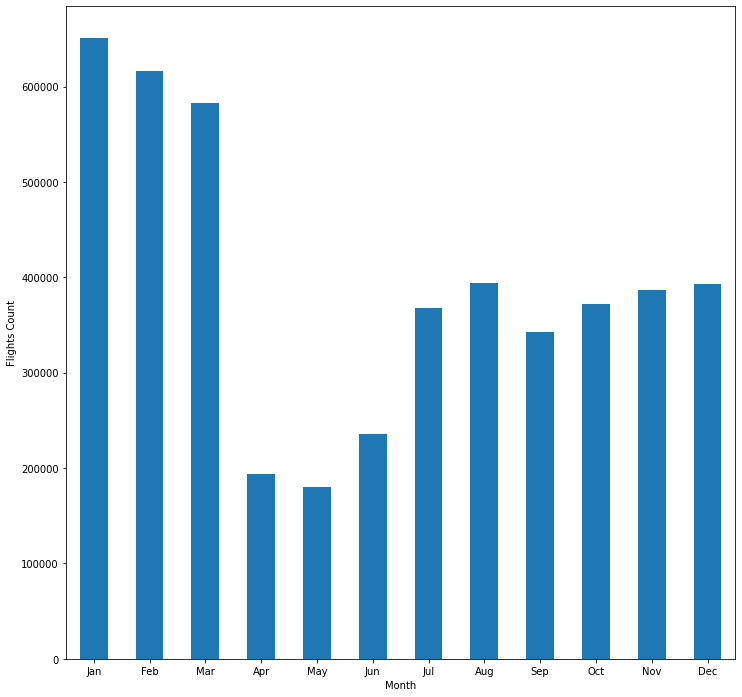

In [0]:
from pyspark.sql import functions as F
import matplotlib.pyplot as plt
from itertools import chain

# Aggregate data
flights_per_month = df.groupBy('Month').agg(F.count('FlightDate').alias('FlightsCount')).orderBy('Month')

# Mapping month numbers to names
month_names = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
               7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}
flights_per_month = flights_per_month.withColumn('Month', F.create_map([F.lit(x) for x in chain(*month_names.items())])[F.col('Month')])

# Convert to Pandas for plotting
flights_per_month_pandas = flights_per_month.toPandas()
flights_per_month_pandas.set_index('Month', inplace=True)

# Plotting
flights_per_month_pandas.plot(
    kind='bar', figsize=(12, 12), rot=0, legend=False, ylabel='Flights Count', xlabel='Month'
)
display(plt)

<module 'matplotlib.pyplot' from '/databricks/python/lib/python3.9/site-packages/matplotlib/pyplot.py'>

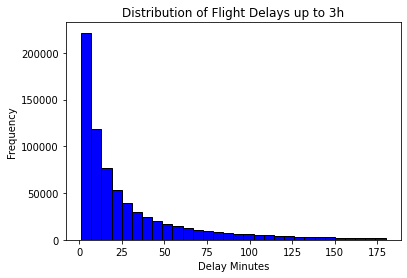

<Figure size 720x432 with 0 Axes>

In [0]:
from pyspark.sql.functions import col
import matplotlib.pyplot as plt

# Filter the DataFrame for delays between 1 minute and 180 minutes
filtered_delays = df.filter((col('DepDelayMinutes') > 0) & (col('DepDelayMinutes') < 181))

# Collect the data as a list
delay_minutes_data = filtered_delays.select('DepDelayMinutes').rdd.flatMap(lambda x: x).collect()

# Use matplotlib to plot the histogram
plt.hist(delay_minutes_data, bins=30, color='blue', edgecolor='black')
plt.title('Distribution of Flight Delays up to 3h')
plt.xlabel('Delay Minutes')
plt.ylabel('Frequency')
plt.figure(figsize=(10,6))
display(plt)

In [0]:
from pyspark.sql.functions import col

# Calculate the number of delays between 0 to 25 minutes
delays0to25 = df.filter((col('DepDelayMinutes') > 0) & (col('DepDelayMinutes') <= 25)).count()

# Calculate the total number of delays greater than 0 minutes
delays_total = df.filter(col('DepDelayMinutes') > 0).count()

# Calculate the percentage
percentage_delays0to25 = (delays0to25 / delays_total) * 100 if delays_total > 0 else 0

percentage_delays0to25

Out[31]: 64.51099157902131

In [0]:
from pyspark.sql import functions as F

# Use the 'withColumn' method to create or overwrite the 'DelayGroup' column based on conditions
df = df.withColumn(
    "DelayGroup",
    F.when(df.Cancelled, "Cancelled")
    .when(df.Diverted, "Diverted")
    .when(df["DepDelayMinutes"] == 0, "OnTime_Early")
    .when((df["DepDelayMinutes"] > 0) & (df["DepDelayMinutes"] <= 15), "Small_Delay")
    .when((df["DepDelayMinutes"] > 15) & (df["DepDelayMinutes"] <= 45), "Medium_Delay")
    .when(df["DepDelayMinutes"] > 45, "Large_Delay")
    .otherwise(None)
)

<module 'matplotlib.pyplot' from '/databricks/python/lib/python3.9/site-packages/matplotlib/pyplot.py'>

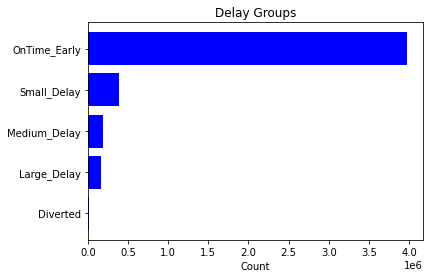

<Figure size 720x360 with 0 Axes>

In [0]:
import matplotlib.pyplot as plt

# Perform the aggregation to count the number of occurrences of each delay group
delay_group_counts = df.groupBy('DelayGroup').count().orderBy('count', ascending=True)

# Collect the result to the driver as a list of rows
delay_group_counts_list = delay_group_counts.collect()

# Prepare data for plotting
delay_groups = [row['DelayGroup'] for row in delay_group_counts_list]
counts = [row['count'] for row in delay_group_counts_list]

# Plotting the horizontal bar chart
plt.barh(delay_groups, counts, color='blue')
plt.xlabel('Count')
plt.title('Delay Groups')
plt.figure(figsize=(10, 5))
display(plt)

In [0]:
from pyspark.sql.functions import col

# Calculate the total number of flights
total_flights = df.count()

# Calculate the number of flights that are on time or early
flights_on_time = df.filter(col('DelayGroup') == 'OnTime_Early').count()

# Calculate the percentage of delayed flights
percentage_delayed_flights = 100 - (flights_on_time / total_flights * 100)

percentage_delayed_flights

In [0]:
from pyspark.sql.functions import col, count, sum as _sum

# Group by Month and DelayGroup and count occurrences
flights_grouped = df.groupBy("Month", "DelayGroup").count()

# Calculate the total counts per month
month_totals = flights_grouped.groupBy("Month").agg(_sum("count").alias("total_per_month"))

# Join to get the total alongside each group count
flights_grouped = flights_grouped.join(month_totals, "Month")

# Calculate the normalized percentage
flights_grouped = flights_grouped.withColumn("percent", (col("count") / col("total_per_month") * 100))

# Pivot the data to get DelayGroups as columns
flights_pivot = flights_grouped.groupBy("Month").pivot("DelayGroup").sum("percent")

---------------------------------------------------------------------------
AnalysisException                         Traceback (most recent call last)
File <command-3009410805923371>:4
      1 from pyspark.sql.functions import col, count, sum as _sum
      3 # Group by Month and DelayGroup and count occurrences
----> 4 flights_grouped = df.groupBy("Month", "DelayGroup").count()
      6 # Calculate the total counts per month
      7 month_totals = flights_grouped.groupBy("Month").agg(_sum("count").alias("total_per_month"))

File /databricks/spark/python/pyspark/instrumentation_utils.py:48, in _wrap_function.<locals>.wrapper(*args, **kwargs)
     46 start = time.perf_counter()
     47 try:
---> 48     res = func(*args, **kwargs)
     49     logger.log_success(
     50         module_name, class_name, function_name, time.perf_counter() - start, signature
     51     )
     52     return res

File /databricks/spark/python/pyspark/sql/group.py:38, in dfapi.<locals>._api(self)
     36 def _

In [0]:
# Define the column order and include all possible DelayGroup values that might exist
col_order = ["OnTime_Early", "Small_Delay", "Medium_Delay", "Large_Delay", "Diverted", "Cancelled"]

# Select columns in the specified order, handling cases where some columns might not exist
flights_pivot = flights_pivot.select(["Month"] + [col for col in col_order if col in flights_pivot.columns])

In [0]:
display(flights_pivot)

Month,OnTime_Early,Small_Delay,Medium_Delay,Large_Delay,Diverted
12,82.53799569831237,9.179730203847113,4.738720781829183,3.4098247291106283,0.13372858690070016
1,76.91352605698219,11.281178442290338,6.274671103116771,5.362108869012173,0.16851552859852786
6,86.90488791041301,7.660619403459007,3.061453460064777,2.2240098223925147,0.14902940367069584
3,84.89864447282766,7.261237691071649,4.158083034622939,3.564095697196929,0.11793910428082897
5,90.41316441078824,5.546796060447918,2.175192369616149,1.6666481606910872,0.19819899845660163
9,88.21699726302398,6.836020705311134,2.7232619618690803,2.0897891536383106,0.13393091615749575
4,92.72712301413713,3.7959765530515512,1.7657260782971629,1.5665608225988237,0.1446135319153316
8,87.5175109125977,6.670642574357934,3.074307176936352,2.527154603593544,0.21038473251446554
7,86.86499652052888,6.709670755045233,3.2584703375086987,2.9385220946416144,0.22834029227557412
10,86.61386244948919,7.498825329914484,3.2090644256198906,2.53513941655815,0.14310837841828994


In [0]:
flights_pivot.show(12)

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-957945082990385>:1
----> 1 flights_pivot.show(12)

NameError: name 'flights_pivot' is not defined

In [0]:
from pyspark.sql.functions import col
from pyspark.ml.feature import StringIndexer

# Aggregate flights by airline
flights_per_airline = df.groupBy("Airline").count()

# Filter for top airlines
top_airlines = flights_per_airline.filter(col("count") > 500000)
top_airlines_list = [row['Airline'] for row in top_airlines.select('Airline').collect()]

# Filter the main DataFrame for flights belonging to top airlines
flights_top_airlines = df.filter(col("Airline").isin(top_airlines_list))

# Optional: Convert 'Airline' to an indexed category for ML purposes
indexer = StringIndexer(inputCol="Airline", outputCol="Airline_Indexed")
flights_top_airlines = indexer.fit(flights_top_airlines).transform(flights_top_airlines)

In [0]:
display(flights_top_airlines)

FlightDate,Airline,Origin,Dest,Cancelled,Diverted,CRSDepTime,DepTime,DepDelayMinutes,DepDelay,ArrTime,ArrDelayMinutes,AirTime,CRSElapsedTime,ActualElapsedTime,Distance,Year,Quarter,Month,DayofMonth,DayOfWeek,Marketing_Airline_Network,Operated_or_Branded_Code_Share_Partners,DOT_ID_Marketing_Airline,IATA_Code_Marketing_Airline,Flight_Number_Marketing_Airline,Operating_Airline,DOT_ID_Operating_Airline,IATA_Code_Operating_Airline,Tail_Number,Flight_Number_Operating_Airline,OriginAirportID,OriginAirportSeqID,OriginCityMarketID,OriginCityName,OriginState,OriginStateFips,OriginStateName,OriginWac,DestAirportID,DestAirportSeqID,DestCityMarketID,DestCityName,DestState,DestStateFips,DestStateName,DestWac,DepDel15,DepartureDelayGroups,DepTimeBlk,TaxiOut,WheelsOff,WheelsOn,TaxiIn,CRSArrTime,ArrDelay,ArrDel15,ArrivalDelayGroups,ArrTimeBlk,DistanceGroup,DivAirportLandings,DepTimeClean,DelayGroup,Airline_Indexed
2020-09-03,Southwest Airlines Co.,PHX,HOU,false,false,1245,1245,0.0,0.0,1711,0.0,135.0,150.0,146.0,1020.0,2020,3,9,3,4,WN,WN,19393,WN,1550,WN,19393,WN,N462WN,1550,14107,1410702,30466,"Phoenix, AZ",AZ,4,Arizona,81,12191,1219102,31453,"Houston, TX",TX,48,Texas,74,0.0,0.0,1200-1259,6.0,1251.0,1706.0,5.0,1715,-4.0,0.0,-1.0,1700-1759,5,0.0,1245,OnTime_Early,0.0
2020-09-03,Southwest Airlines Co.,PHX,OAK,false,false,0700,656,0.0,null,null,0.0,88.0,120.0,107.0,646.0,2020,3,9,3,4,WN,WN,19393,WN,1201,WN,19393,WN,N8697C,1201,14107,1410702,30466,"Phoenix, AZ",AZ,4,Arizona,81,13796,1379608,32457,"Oakland, CA",CA,6,California,91,0.0,-1.0,0700-0759,11.0,707.0,835.0,8.0,0900,null,0.0,-2.0,0900-0959,3,0.0,656,OnTime_Early,0.0
2020-09-03,Southwest Airlines Co.,PWM,BWI,false,false,1030,1025,0.0,-5.0,1149,0.0,75.0,90.0,84.0,452.0,2020,3,9,3,4,WN,WN,19393,WN,291,WN,19393,WN,N7721E,291,14321,1432105,34321,"Portland, ME",ME,23,Maine,12,10821,1082106,30852,"Baltimore, MD",MD,24,Maryland,35,0.0,-1.0,1000-1059,7.0,1032.0,1147.0,2.0,1200,-11.0,0.0,-1.0,1200-1259,2,0.0,1025,OnTime_Early,0.0
2020-09-03,Southwest Airlines Co.,SAN,PHX,false,false,1930,1937,7.0,7.0,2055,5.0,58.0,80.0,78.0,304.0,2020,3,9,3,4,WN,WN,19393,WN,1094,WN,19393,WN,N464WN,1094,14679,1467903,33570,"San Diego, CA",CA,6,California,91,14107,1410702,30466,"Phoenix, AZ",AZ,4,Arizona,81,0.0,0.0,1900-1959,12.0,1949.0,2047.0,8.0,2050,5.0,0.0,0.0,2000-2059,2,0.0,1937,Small_Delay,0.0
2020-09-03,Southwest Airlines Co.,SLC,PHX,false,false,1950,1946,0.0,-4.0,2013,0.0,72.0,95.0,87.0,507.0,2020,3,9,3,4,WN,WN,19393,WN,888,WN,19393,WN,N411WN,888,14869,1486903,34614,"Salt Lake City, UT",UT,49,Utah,87,14107,1410702,30466,"Phoenix, AZ",AZ,4,Arizona,81,0.0,-1.0,1900-1959,9.0,1955.0,2007.0,6.0,2025,-12.0,0.0,-1.0,2000-2059,3,0.0,1946,OnTime_Early,0.0
2020-09-04,Southwest Airlines Co.,BNA,DEN,false,false,1710,1707,0.0,-3.0,1843,0.0,139.0,165.0,156.0,1014.0,2020,3,9,4,5,WN,WN,19393,WN,255,WN,19393,WN,N8540V,255,10693,1069302,30693,"Nashville, TN",TN,47,Tennessee,54,11292,1129202,30325,"Denver, CO",CO,8,Colorado,82,0.0,-1.0,1700-1759,11.0,1718.0,1837.0,6.0,1855,-12.0,0.0,-1.0,1800-1859,5,0.0,1707,OnTime_Early,0.0
2020-09-04,Southwest Airlines Co.,BOS,BWI,false,false,0600,558,0.0,null,null,0.0,62.0,95.0,78.0,369.0,2020,3,9,4,5,WN,WN,19393,WN,1699,WN,19393,WN,N8522P,1699,10721,1072102,30721,"Boston, MA",MA,25,Massachusetts,13,10821,1082106,30852,"Baltimore, MD",MD,24,Maryland,35,0.0,-1.0,0600-0659,9.0,607.0,709.0,7.0,0735,null,0.0,-2.0,0700-0759,2,0.0,558,OnTime_Early,0.0
2020-09-04,Southwest Airlines Co.,LAS,BNA,false,false,1850,1845,0.0,-5.0,null,0.0,196.0,210.0,210.0,1587.0,2020,3,9,4,5,WN,WN,19393,WN,908,WN,19393,WN,N292WN,908,12889,1288903,32211,"Las Vegas, NV",NV,32,Nevada,85,10693,1069302,30693,"Nashville, TN",TN,47,Tennessee,54,0.0,-1.0,1800-1859,9.0,1854.0,10.0,5.0,0020,null,0.0,-1.0,0001-0559,7,0.0,1845,OnTime_Early,0.0
2020-09-04,Southwest Airlines Co.,LAX,OAK,false,false,1035,1031,0.0,-4.0,1136,0.0,53.0,85.0,65.0,337.0,2020,3,9,4,5,WN,WN,19393,WN,779,WN,19393,WN,N946WN,779,12892,1289208,32575,"Los Angeles, 

In [0]:
display(flights_per_airline)

Airline,count
"GoJet Airlines, LLC d/b/a United Express",36666
Endeavor Air Inc.,204490
Allegiant Air,84138
SkyWest Airlines Inc.,571812
Horizon Air,91583
United Air Lines Inc.,285582
Air Wisconsin Airlines Corp,50453
Trans States Airlines,17083
Compass Airlines,14680
Comair Inc.,178431


In [0]:
from pyspark.sql import functions as F

# Group by 'Airline' and 'DelayGroup' and count occurrences
flights_grouped = flights_top_airlines.groupBy("Airline", "DelayGroup").count()

In [0]:
# Calculate the total number of flights per airline
total_flights_per_airline = flights_grouped.groupBy("Airline").agg(F.sum("count").alias("total_count"))

In [0]:
# Join to add the total count to each row and calculate the percentage
flights_grouped = flights_grouped.join(total_flights_per_airline, "Airline")
flights_grouped = flights_grouped.withColumn("percentage", (F.col("count") / F.col("total_count")) * 100)

In [0]:
# Pivot the DataFrame so DelayGroups become columns with their percentages
flights_agg = flights_grouped.groupBy("Airline").pivot("DelayGroup").sum("percentage")

In [0]:
# Specify the order of DelayGroup columns
col_order = ["OnTime_Early", "Small_Delay", "Medium_Delay", "Large_Delay", "Diverted"]

# Ensure that all desired columns are present, even if some categories might be missing in the data
for col_name in col_order:
    if col_name not in flights_agg.columns:
        flights_agg = flights_agg.withColumn(col_name, F.lit(None))

# Select columns in the specified order
flights_agg = flights_agg.select(["Airline"] + col_order)

In [0]:
# Convert PySpark DataFrame to Pandas DataFrame
flights_agg_pd = flights_agg.toPandas()

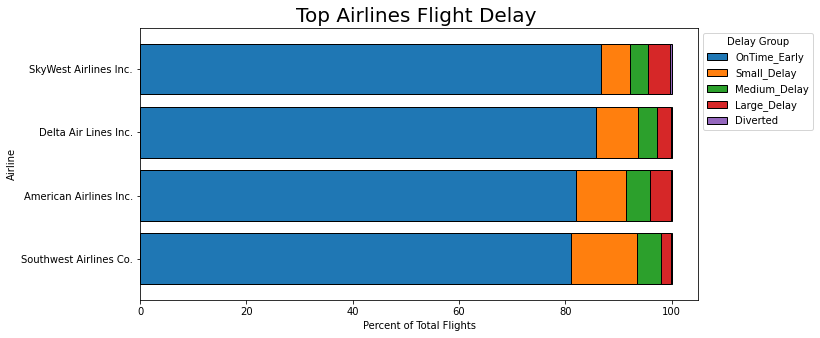

In [0]:
import matplotlib.pyplot as plt

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(10, 5))

# Sort the DataFrame based on 'OnTime_Early' for better visualization
flights_agg_pd.sort_values("OnTime_Early", inplace=True)

# Plot using Pandas integration with Matplotlib for a horizontal bar chart
flights_agg_pd.set_index('Airline').plot(
    kind='barh',
    stacked=True,
    ax=ax,
    width=0.8,
    edgecolor='black'
)

# Adjust legend position
ax.legend(title="Delay Group", bbox_to_anchor=(1, 1))

# Set title and labels
ax.set_title("Top Airlines Flight Delay ", fontsize=20)
ax.set_xlabel("Percent of Total Flights")

# Show the plot
plt.show()

In [0]:
delay_mapping = {
    "OnTime_Early": "OK",
    "Small_Delay": "OK",
    "Medium_Delay": "Not OK",
    "Large_Delay": "Not OK",
    "Cancelled": "Not OK",
}

In [0]:
from pyspark.sql.functions import when, col

# Assuming `flights_top_airlines` is your DataFrame and it already includes the 'DelayGroup' column
flights_top_airlines = flights_top_airlines.withColumn(
    "DelayOk",
    when(col("DelayGroup") == "OnTime_Early", delay_mapping["OnTime_Early"])
    .when(col("DelayGroup") == "Small_Delay", delay_mapping["Small_Delay"])
    .when(col("DelayGroup") == "Medium_Delay", delay_mapping["Medium_Delay"])
    .when(col("DelayGroup") == "Large_Delay", delay_mapping["Large_Delay"])
    .when(col("DelayGroup") == "Cancelled", delay_mapping["Cancelled"])
    .otherwise("Unknown")  # Handle any unexpected or missing categories
)


In [0]:
from pyspark.sql.functions import col, count

# Group by Airline and DelayOk, then count occurrences
grouped_data = flights_top_airlines.groupBy("Airline", "DelayOk").count()


In [0]:
from pyspark.sql.window import Window
from pyspark.sql.functions import sum as _sum

# Window specification to partition data by Airline
window_spec = Window.partitionBy("Airline")

# Calculate total flights per airline
grouped_data = grouped_data.withColumn("TotalFlights", _sum("count").over(window_spec))


In [0]:
# Normalize the counts to get the percentage
grouped_data = grouped_data.withColumn("Percentage", (col("count") / col("TotalFlights")) * 100)


In [0]:
# Pivot the DataFrame to have DelayOk categories as columns
pivot_data = grouped_data.groupBy("Airline").pivot("DelayOk", ["OK", "Not OK"]).sum("Percentage")


In [0]:
# Convert the pivot data to a Pandas DataFrame
pivot_data_pd = pivot_data.toPandas().set_index("Airline")


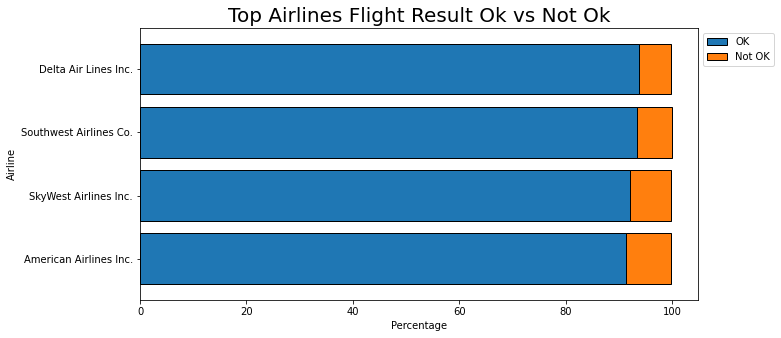

In [0]:
import matplotlib.pyplot as plt

# Plotting the data
fig, ax = plt.subplots(figsize=(10, 5))
pivot_data_pd.sort_values("OK").plot(
    kind="barh", stacked=True, ax=ax, width=0.8, edgecolor="black"
)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.set_title("Top Airlines Flight Result Ok vs Not Ok", fontsize=20)
ax.set_xlabel("Percentage")
plt.show()


In [0]:
#What is percentage of having 0 delays

In [0]:
from pyspark.sql.functions import col

# Count the total number of flights
total_flights = df.count()

# Count the number of flights with a departure delay greater than zero
delays_total = df.filter(col("DepDelayMinutes") > 0).count()

In [0]:
# Calculate the percentage of delayed flights
delay_chance = (delays_total / total_flights) * 100 if total_flights > 0 else 0

In [0]:
print(f"Percentage of delayed flights: {delay_chance}%")

Percentage of delayed flights: 15.687794466399813%


In [0]:
##Chance of having a delay less than 15 min?

In [0]:
from pyspark.sql.functions import col

# Calculate counts of delays
delays_total = df.filter(col("DepDelayMinutes") > 0).count()
delays0to15 = df.filter((col("DepDelayMinutes") > 0) & (col("DepDelayMinutes") <= 16)).count()

# Calculate probabilities
delay_chance = (delays_total / total_flights) * 100 if total_flights > 0 else 0
less_than_15_min_delay_chance = (delays0to15 / delays_total) * 100 if delays_total > 0 else 0

# Conditional probability calculation
conditional_probability = (delay_chance / 100) * (less_than_15_min_delay_chance / 100)

# Output the result
print(f"Probability of a delay and that it's less than 15 minutes: {conditional_probability * 100:.2f}%")


Probability of a delay and that it's less than 15 minutes: 8.36%


In [0]:
##Chance of having a delay if u fly with X company? How about having a large delay? (> 45 min)

In [0]:
# Use the 'withColumn' method to create or overwrite the 'DelayGroup' column based on conditions
df = df.withColumn(
    "DelayGroup",
    F.when(df.Cancelled, "Cancelled")
    .when(df.Diverted, "Diverted")
    .when(df["DepDelayMinutes"] == 0, "OnTime_Early")
    .when((df["DepDelayMinutes"] > 0) & (df["DepDelayMinutes"] <= 15), "Small_Delay")
    .when((df["DepDelayMinutes"] > 15) & (df["DepDelayMinutes"] <= 45), "Medium_Delay")
    .when(df["DepDelayMinutes"] > 45, "Large_Delay")
    .otherwise(None)
)

In [0]:
from pyspark.sql.functions import col

# Filter flights for "JetBlue Airways"
company_flights = df.filter(col("Airline") == "Southwest Airlines Co.")

# Count flights
total_flights_of_company = company_flights.count()

# Calculate any delays
total_delays_from_company = company_flights.filter(col("DepDelayMinutes") > 0).count()
percentage_delays = (total_delays_from_company / total_flights_of_company * 100) if total_flights_of_company > 0 else 0

# Calculate large delays
large_delays_from_company = company_flights.filter(col("DepDelayMinutes") > 45).count()
percentage_large_delays = (large_delays_from_company / total_flights_of_company * 100) if total_flights_of_company > 0 else 0

# Calculate large delays
large_delays_from_company = company_flights.filter(col("DepDelayMinutes") > 45).count()
percentage_large_delays = (large_delays_from_company / total_flights_of_company * 100) if total_flights_of_company > 0 else 0

# Output results
print(f"Percentage of delayed flights for Southwest Airlines Co.: {percentage_delays:.2f}%")
print(f"Percentage of large delayed flights (>45 min) for Southwest Airlines Co.: {percentage_large_delays:.2f}%")

Percentage of delayed flights for Southwest Airlines Co.: 18.88%
Percentage of large delayed flights (>45 min) for Southwest Airlines Co.: 1.97%


In [0]:
# On Time Early
on_time_early_from_company = company_flights.filter(col("DelayGroup") == "OnTime_Early").count()
percentage_on_time_early = (on_time_early_from_company / total_flights_of_company * 100) if total_flights_of_company > 0 else 0

# Small Delay
small_delays_from_company = company_flights.filter(col("DelayGroup") == "Small_Delay").count()
percentage_small_delays = (small_delays_from_company / total_flights_of_company * 100) if total_flights_of_company > 0 else 0

# Medium Delay
medium_delays_from_company = company_flights.filter(col("DelayGroup") == "Medium_Delay").count()
percentage_medium_delays = (medium_delays_from_company / total_flights_of_company * 100) if total_flights_of_company > 0 else 0

In [0]:

print(f"Percentage of large delayed flights (>45 min) for Southwest Airlines Co.: {percentage_on_time_early:.2f}%")

In [0]:
#Chance of delays if you fly in particular month

In [0]:
from pyspark.sql.functions import col

# Filter flights for June
june_flights = df.filter(col("Month") == 1)

# Count total flights in June
total_flights_june = june_flights.count()

# Calculate delays in June
total_delays_june = june_flights.filter(col("DepDelayMinutes") > 0).count()
percentage_delays_june = (total_delays_june / total_flights_june * 100) if total_flights_june > 0 else 0

# Output the percentage of delayed flights in June
print(f"Percentage of delayed flights in June: {percentage_delays_june:.2f}%")

Percentage of delayed flights in June: 22.97%


In [0]:
from pyspark.sql.functions import col

# Filter flights by month and calculate the percentage of delayed flights for each month
monthly_delay_data = df.groupBy("Month").agg(
    F.count("*").alias("TotalFlights"),
    F.sum((col("DepDelayMinutes") > 0).cast("int")).alias("TotalDelays")
).withColumn(
    "PercentageDelays", F.col("TotalDelays") / F.col("TotalFlights") * 100
).orderBy("Month")

# Collect the data
monthly_delay_data_list = monthly_delay_data.collect()

# Prepare data for plotting
months = [row['Month'] for row in monthly_delay_data_list]
percentages = [row['PercentageDelays'] for row in monthly_delay_data_list]




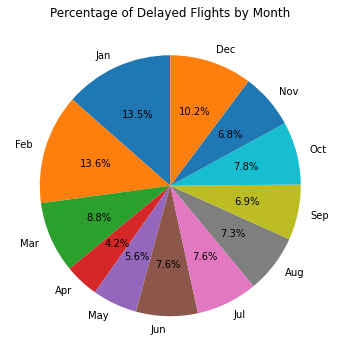

In [0]:
# Plotting the data
import matplotlib.pyplot as plt
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.figure(figsize=(10, 6))
plt.pie(percentages, labels=months, autopct='%1.1f%%', startangle=90)
plt.title('Percentage of Delayed Flights by Month')
plt.show()

In [0]:
####PREDICTIONS

In [0]:
from pyspark.ml.feature import StringIndexer, VectorAssembler
from pyspark.ml import Pipeline

# Define StringIndexer for categorical columns
indexers = [
    StringIndexer(inputCol=column, outputCol=column+"_Index").fit(df)
    for column in ['Airline', 'OriginStateName', 'DestStateName', 'Origin', 'Dest']
]

# Set up the VectorAssembler to combine feature columns into a single features column
assembler = VectorAssembler(inputCols=[column+"_Index" for column in ['Airline', 'OriginStateName', 'DestStateName', 'Origin', 'Dest']] + ['Month'],
                            outputCol="features")

# Define the stages in the pipeline
pipeline = Pipeline(stages=indexers + [assembler])

# Apply transformations
flights_transformed = pipeline.fit(df).transform(df)

In [0]:
from pyspark.sql.functions import col
from pyspark.ml.feature import Binarizer

# Create binary labels
binarizer = Binarizer(threshold=0.0, inputCol="DepDelay", outputCol="label")
flights_transformed = binarizer.transform(flights_transformed)

# Split data into training and test sets
(train_df, test_df) = flights_transformed.randomSplit([0.8, 0.2], seed=1)

In [0]:
from pyspark.sql.functions import col

# Check for null or NaN values in the label column and filter them out
train_df = train_df.filter(col("label").isNotNull())
test_df = test_df.filter(col("label").isNotNull())

In [0]:
from pyspark.ml.classification import GBTClassifier
gbt = GBTClassifier(maxBins=400)  # Set maxBins to a value higher than 375
model = gbt.fit(train_df)


In [0]:
# Continue with predictions and evaluation as before
predictions = model.transform(test_df)

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Evaluate model with accuracy
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)
print("Accuracy = %g" % accuracy)

# If you also want to check other metrics like F1 Score
f1_evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="f1")
f1_score = f1_evaluator.evaluate(predictions)
print("F1 Score = %g" % f1_score)

Accuracy = 0.780241
F1 Score = 0.694414


In [0]:
from pyspark.ml.classification import LogisticRegression

In [0]:
lr = LogisticRegression(maxIter=10) # Set maxBins to a value higher than 375
model_lr = lr.fit(train_df)

In [0]:
# Continue with predictions and evaluation as before
predictions_lr = model_lr.transform(test_df)

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Evaluate model with accuracy
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions_lr)
print("Accuracy = %g" % accuracy)

# If you also want to check other metrics like F1 Score
f1_evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="f1")
f1_score = f1_evaluator.evaluate(predictions_lr)
print("F1 Score = %g" % f1_score)

Accuracy = 0.779415
F1 Score = 0.682795


In [0]:
from pyspark.ml.classification import LinearSVC
svm = LinearSVC(maxIter=10)
model_svm = svm.fit(train_df)

In [0]:
# Continue with predictions and evaluation as before
predictions_s = model_svm.transform(test_df)

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Evaluate model with accuracy
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions_s)
print("Accuracy = %g" % accuracy)

# If you also want to check other metrics like F1 Score
f1_evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="f1")
f1_score = f1_evaluator.evaluate(predictions_s)
print("F1 Score = %g" % f1_score)

Accuracy = 0.779415
F1 Score = 0.682795


In [0]:
from pyspark.ml.classification import RandomForestClassifier
rf = RandomForestClassifier(maxBins=400)
model_rd = rf.fit(train_df)

In [0]:
# Continue with predictions and evaluation as before
predictions_rd = model_rd.transform(test_df)

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Evaluate model with accuracy
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="predictions", metricName="accuracy")
accuracy = evaluator.evaluate(predictions_rd)
print("Accuracy = %g" % accuracy)

# If you also want to check other metrics like F1 Score
f1_evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="predictions", metricName="f1")
f1_score = f1_evaluator.evaluate(predictions_rd)
print("F1 Score = %g" % f1_score)

---------------------------------------------------------------------------
IllegalArgumentException                  Traceback (most recent call last)
File <command-660663414232055>:5
      3 # Evaluate model with accuracy
      4 evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="predictions_rd", metricName="accuracy")
----> 5 accuracy = evaluator.evaluate(predictions_rd)
      6 print("Accuracy = %g" % accuracy)
      8 # If you also want to check other metrics like F1 Score

File /databricks/spark/python/pyspark/ml/evaluation.py:111, in Evaluator.evaluate(self, dataset, params)
    109         return self.copy(params)._evaluate(dataset)
    110     else:
--> 111         return self._evaluate(dataset)
    112 else:
    113     raise TypeError("Params must be a param map but got %s." % type(params))

File /databricks/spark/python/pyspark/ml/evaluation.py:148, in JavaEvaluator._evaluate(self, dataset)
    146 self._transfer_params_to_java()
    147 assert s

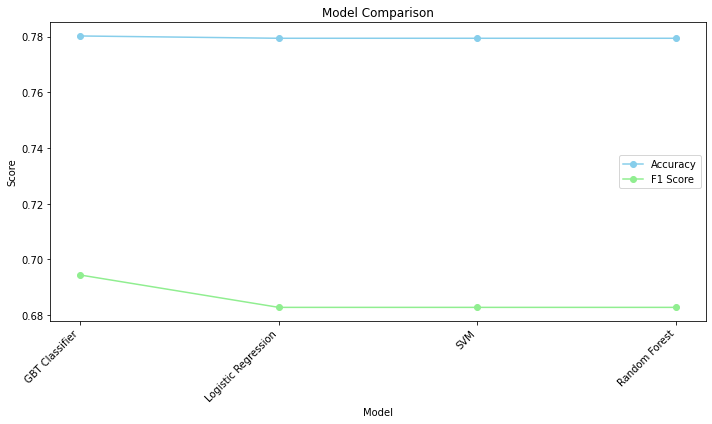

In [0]:
import matplotlib.pyplot as plt

# Model names
models = ['GBT Classifier', 'Logistic Regression', 'SVM', 'Random Forest']
x = range(len(models))

# Accuracy scores
accuracy_scores = [0.780241, 0.779415, 0.779415, 0.779415]

# F1 scores
f1_scores = [0.694414, 0.682795, 0.682795, 0.682795]

# Create figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Plot accuracy scores
ax.plot(x, accuracy_scores, marker='o', label='Accuracy', color='skyblue')

# Plot F1 scores
ax.plot(x, f1_scores, marker='o', label='F1 Score', color='lightgreen')

# Set labels and title
ax.set_xlabel('Model')
ax.set_ylabel('Score')
ax.set_title('Model Comparison')
ax.set_xticks(x)
ax.set_xticklabels(models, rotation=45, ha='right')
ax.legend()

plt.tight_layout()
plt.show()


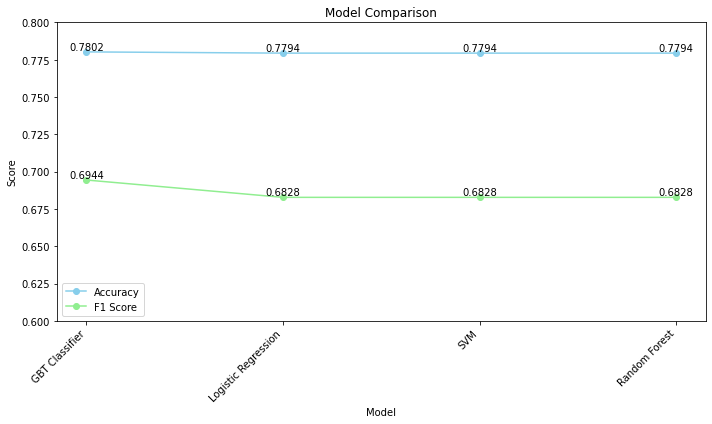

In [0]:
import matplotlib.pyplot as plt

# Model names
models = ['GBT Classifier', 'Logistic Regression', 'SVM', 'Random Forest']
x = range(len(models))

# Accuracy scores
accuracy_scores = [0.780241, 0.779415, 0.779415, 0.779415]

# F1 scores
f1_scores = [0.694414, 0.682795, 0.682795, 0.682795]

# Create figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Plot accuracy scores
ax.plot(x, accuracy_scores, marker='o', label='Accuracy', color='skyblue')

# Plot F1 scores
ax.plot(x, f1_scores, marker='o', label='F1 Score', color='lightgreen')

# Annotate points with values
for i, (acc, f1) in enumerate(zip(accuracy_scores, f1_scores)):
    ax.text(i, acc, f'{acc:.4f}', ha='center', va='bottom')
    ax.text(i, f1, f'{f1:.4f}', ha='center', va='bottom')

# Set labels and title
ax.set_xlabel('Model')
ax.set_ylabel('Score')
ax.set_title('Model Comparison')
ax.set_xticks(x)
ax.set_xticklabels(models, rotation=45, ha='right')
ax.legend()

# Set y-axis limits for better visualization
ax.set_ylim(0.6, 0.8)

plt.tight_layout()
plt.show()
